In [1]:
import os
import sys
import json
import datetime
import random
import re
import math
import numpy as np
import skimage.draw
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches

%matplotlib inline


/Users/samiagilani/opt/anaconda3/envs/mask_rcnn/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/Users/samiagilani/opt/anaconda3/envs/mask_rcnn/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/Users/samiagilani/opt/anaconda3/envs/mask_rcnn/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/Users/

In [2]:
# Root directory of the project
ROOT_DIR = os.path.abspath("../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn.config import Config
from mrcnn import model as modellib, utils, visualize
from mrcnn.visualize import display_images
from mrcnn.model import log


# Path to trained weights file
COCO_WEIGHTS_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")

# Directory to save logs and model checkpoints, if not provided
# through the command line argument --logs
DEFAULT_LOGS_DIR = os.path.join(ROOT_DIR, "logs")
MODEL_DIR = DEFAULT_LOGS_DIR

Using TensorFlow backend.


In [47]:
os.getcwd()

'/Users/samiagilani/Desktop/Senior-Project/CIS4914SeniorProject/DynamicMLTechnique/root'

In [3]:
class RootConfig(Config):
    """Configuration for training on the toy  dataset.
    Derives from the base Config class and overrides some values.
    """
    # Give the configuration a recognizable name
    NAME = "root"

    # We use a GPU with 12GB memory, which can fit two images.
    # Adjust down if you use a smaller GPU.
    IMAGES_PER_GPU = 1

    # Number of classes (including background)
    NUM_CLASSES = 1 + 1  # Background + root

    # Number of training steps per epoch
    STEPS_PER_EPOCH = 100

    # Skip detections with < 90% confidence
    DETECTION_MIN_CONFIDENCE = 0.9

In [4]:
############################################################
#  Dataset
############################################################

class RootDataset(utils.Dataset):

    def load_root(self, dataset_dir, subset, skip_empty=True):
        """Load a subset of the Balloon dataset.
        dataset_dir: Root directory of the dataset.
        subset: Subset to load: train or val
        """
        # Add classes. We have only one class to add.
        self.add_class("root", 1, "root")

        # Train or validation dataset?
        assert subset in ["train", "val"]
        dataset_dir = os.path.join(dataset_dir, subset)

        # Load annotations
        # We mostly care about the x and y coordinates of each region
        # Note: In VIA 2.0, regions was changed from a dict to a list.
        annotations = json.load(open(os.path.join(dataset_dir, "annotations.json")))
        annotations = list(annotations.values())  # don't need the dict keys

        # The VIA tool saves images in the JSON even if they don't have any
        # annotations. Skip unannotated images.
        if (skip_empty):
            annotations = [a for a in annotations if a['regions']]

        # Add images
        for a in annotations:
            # Get the x, y coordinaets of points of the polygons that make up
            # the outline of each object instance. These are stores in the
            # shape_attributes (see json format above)
            # The if condition is needed to support VIA versions 1.x and 2.x.
            if type(a['regions']) is dict:
                polygons = [r['shape_attributes'] for r in a['regions'].values()]
            else:
                polygons = [r['shape_attributes'] for r in a['regions']] 

            # load_mask() needs the image size to convert polygons to masks.
            # Unfortunately, VIA doesn't include it in JSON, so we must read
            # the image. This is only managable since the dataset is tiny.
            image_path = os.path.join(dataset_dir, a['filename'])
            image = skimage.io.imread(image_path)
            height, width = image.shape[:2]

            self.add_image(
                "root",
                image_id=a['filename'],  # use file name as a unique image id
                path=image_path,
                width=width, height=height,
                polygons=polygons)

    def load_mask(self, image_id):
        """Generate instance masks for an image.
       Returns:
        masks: A bool array of shape [height, width, instance count] with
            one mask per instance.
        class_ids: a 1D array of class IDs of the instance masks.
        """
        # If not a balloon dataset image, delegate to parent class.
        image_info = self.image_info[image_id]
        if image_info["source"] != "root":
            return super(self.__class__, self).load_mask(image_id)

        # Convert polygons to a bitmap mask of shape
        # [height, width, instance_count]
        info = self.image_info[image_id]
        mask = np.zeros([info["height"], info["width"], len(info["polygons"])],
                        dtype=np.uint8)
        for i, p in enumerate(info["polygons"]):
            # Get indexes of pixels inside the polygon and set them to 1
            rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'])
            mask[rr, cc, i] = 1

        # Return mask, and array of class IDs of each instance. Since we have
        # one class ID only, we return an array of 1s
        return mask.astype(np.bool), np.ones([mask.shape[-1]], dtype=np.int32)

    def image_reference(self, image_id):
        """Return the path of the image."""
        info = self.image_info[image_id]
        if info["source"] == "root":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)

In [5]:
class InferenceDataset():
    def __init__(self, directory: str, extensions=['.png', '.jpg']):
        self.image_ids = []
        self.image_info = {}
        for root, _, files in os.walk(directory):
            for file in files:
                if os.path.splitext(file)[1] in extensions:
                    self.image_ids.append(file)
                    self.image_info[file] = {
                        'path': os.path.join(root, file)
                    }

    def load_image(self, image_id):
        """Load the specified image and return a [H,W,3] Numpy array.
        """
        # Load image
        image = skimage.io.imread(self.image_info[image_id]['path'])
        # If grayscale. Convert to RGB for consistency.
        if image.ndim != 3:
            image = skimage.color.gray2rgb(image)
        # If has an alpha channel, remove it for consistency
        if image.shape[-1] == 4:
            image = image[..., :3]
        return image


In [6]:
def train(model):
    """Train the model."""
    # Training dataset.
    dataset_train = RootDataset()
    dataset_train.load_root("../dataset", "train")
    dataset_train.prepare()

    # Validation dataset
    dataset_val = RootDataset()
    dataset_val.load_root("../dataset", "val")
    dataset_val.prepare()

    # *** This training schedule is an example. Update to your needs ***
    # Since we're using a very small dataset, and starting from
    # COCO trained weights, we don't need to train too long. Also,
    # no need to train all layers, just the heads should do it.
    print("Training network heads")
    model.train(dataset_train, dataset_val,
                learning_rate=config.LEARNING_RATE,
                epochs=30,
                layers='heads')

In [7]:
def color_splash(image, mask):
    """Apply color splash effect.
    image: RGB image [height, width, 3]
    mask: instance segmentation mask [height, width, instance count]

    Returns result image.
    """
    # Make a grayscale copy of the image. The grayscale copy still
    # has 3 RGB channels, though.
    gray = skimage.color.gray2rgb(skimage.color.rgb2gray(image)) * 255
    # Copy color pixels from the original color image where mask is set
    if mask.shape[-1] > 0:
        # We're treating all instances as one, so collapse the mask into one layer
        mask = (np.sum(mask, -1, keepdims=True) >= 1)
        splash = np.where(mask, image, gray).astype(np.uint8)
    else:
        splash = gray.astype(np.uint8)
    return splash
    

In [8]:
def detect_and_color_splash(model, image_path=None, video_path=None):
    assert image_path or video_path

    # Image or video?
    if image_path:
        # Run model detection and generate the color splash effect
        print("Running on {}".format(args.image))
        # Read image
        image = skimage.io.imread(args.image)
        # Detect objects
        r = model.detect([image], verbose=1)[0]
        # Color splash
        splash = color_splash(image, r['masks'])
        # Save output
        file_name = "splash_{:%Y%m%dT%H%M%S}.png".format(datetime.datetime.now())
        skimage.io.imsave(file_name, splash)
    # elif video_path:
    #     import cv2
    #     # Video capture
    #     vcapture = cv2.VideoCapture(video_path)
    #     width = int(vcapture.get(cv2.CAP_PROP_FRAME_WIDTH))
    #     height = int(vcapture.get(cv2.CAP_PROP_FRAME_HEIGHT))
    #     fps = vcapture.get(cv2.CAP_PROP_FPS)

    #     # Define codec and create video writer
    #     file_name = "splash_{:%Y%m%dT%H%M%S}.avi".format(datetime.datetime.now())
    #     vwriter = cv2.VideoWriter(file_name,
    #                               cv2.VideoWriter_fourcc(*'MJPG'),
    #                               fps, (width, height))

    #     count = 0
    #     success = True
    #     while success:
    #         print("frame: ", count)
    #         # Read next image
    #         success, image = vcapture.read()
    #         if success:
    #             # OpenCV returns images as BGR, convert to RGB
    #             image = image[..., ::-1]
    #             # Detect objects
    #             r = model.detect([image], verbose=0)[0]
    #             # Color splash
    #             splash = color_splash(image, r['masks'])
    #             # RGB -> BGR to save image to video
    #             splash = splash[..., ::-1]
    #             # Add image to video writer
    #             vwriter.write(splash)
    #             count += 1
    #     vwriter.release()
    print("Saved to ", file_name)

In [8]:
config = RootConfig()

In [9]:
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [6]:
DEVICE = "/cpu:0"
def get_ax(rows=1, cols=1, size=16):
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

In [10]:
# Load validation dataset
dataset = RootDataset()
dataset.load_root(os.path.join(ROOT_DIR, "dataset"), "val")

# Must call before using the dataset
dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

FileNotFoundError: [Errno 2] No such file or directory: '/Users/samiagilani/Desktop/Senior-Project/CIS4914SeniorProject/DynamicMLTechnique/dataset/val/annotations.json'

In [11]:
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", model_dir=os.path.join(ROOT_DIR, "logs"), config=config)

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
Use tf.cast instead.


In [12]:
weights_path = model.find_last()
print("Loading weights ", weights_path)
model.load_weights(weights_path, by_name=True)

Loading weights  /Users/samiagilani/Desktop/Senior-Project/CIS4914SeniorProject/DynamicMLTechnique/logs/root20211107T1231/mask_rcnn_root_0030.h5
Re-starting from epoch 30


Processing 1 images
image                    shape: (480, 640, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
{'rois': array([[  0, 113, 371, 630]], dtype=int32), 'class_ids': array([1], dtype=int32), 'scores': array([0.9995388], dtype=float32), 'masks': array([[[False],
        [False],
        [False],
        ...,
        [False],
        [False],
        [False]],

       [[False],
        [False],
        [False],
        ...,
        [False],
        [False],
        [False]],

       [[False],
        [False],
        [False],
        ...,
        [False],
        [False],
        [False]],

       ...,

       [[False],
        [False],
        [False],
        ...,
        [False],
        

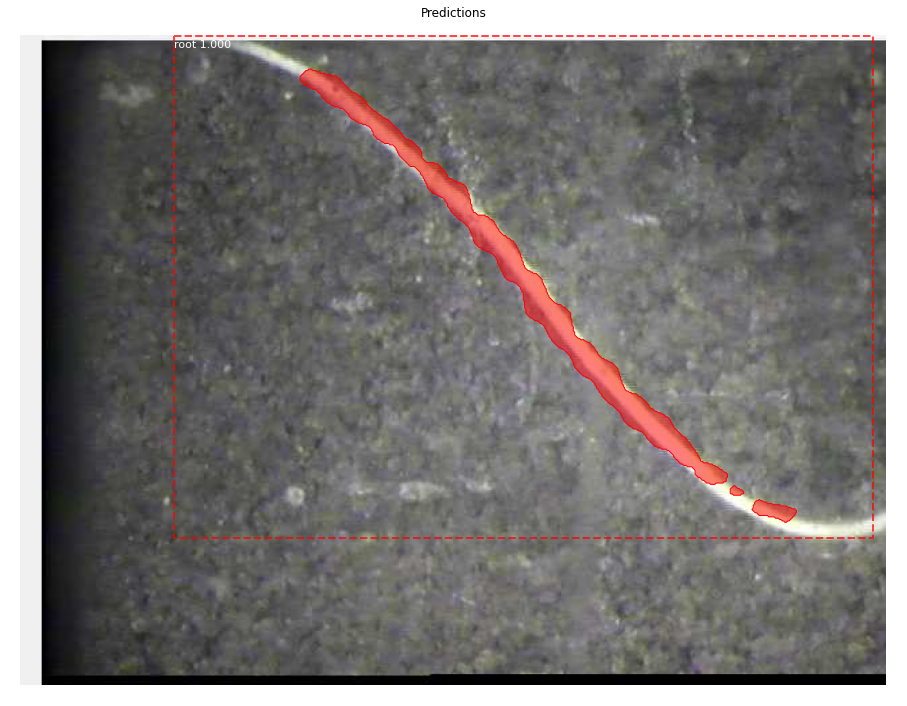

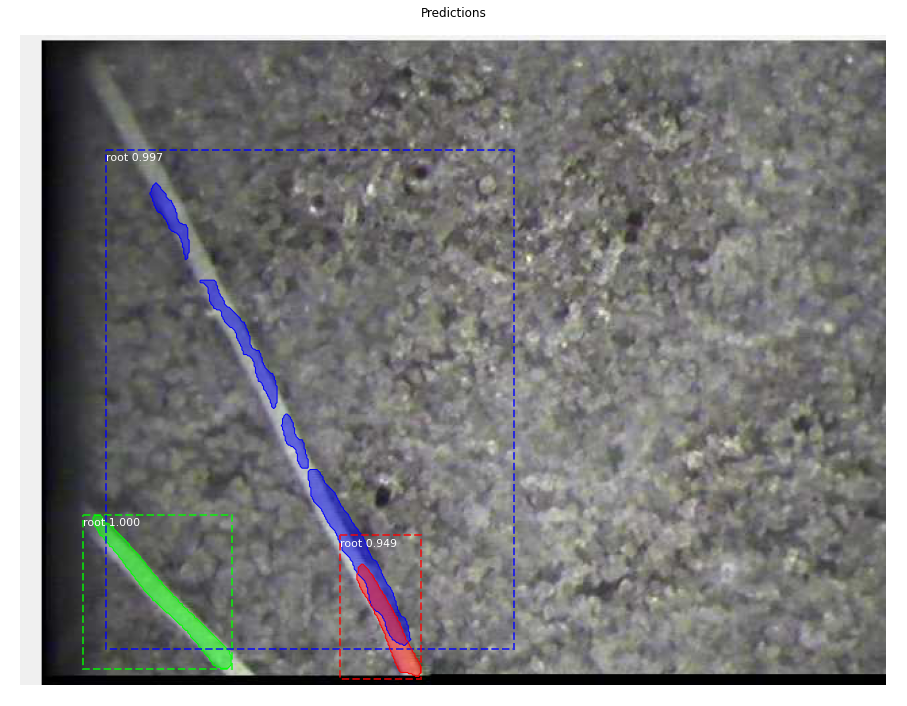

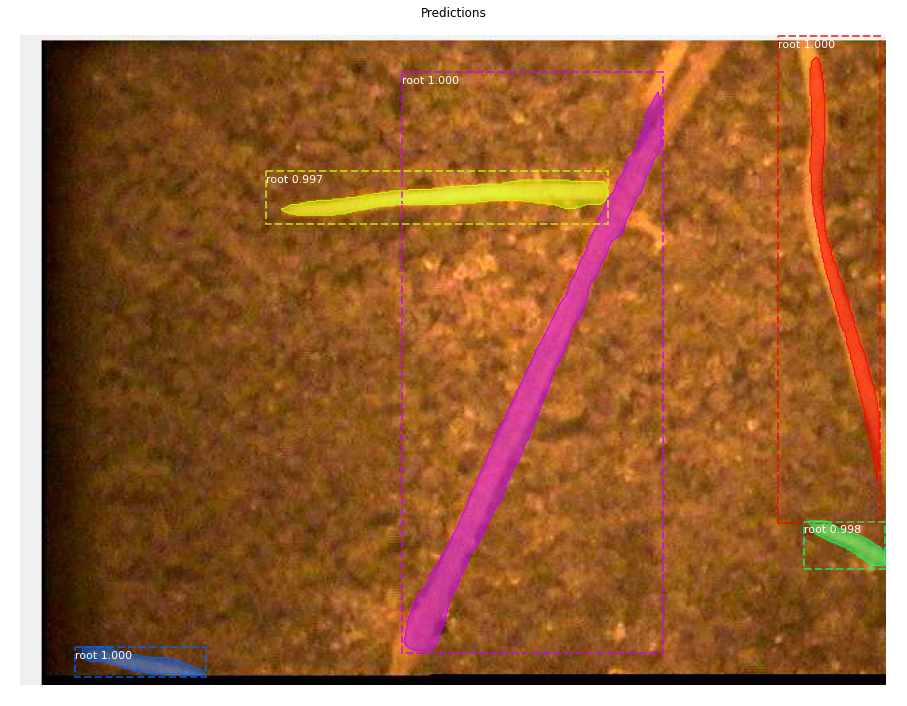

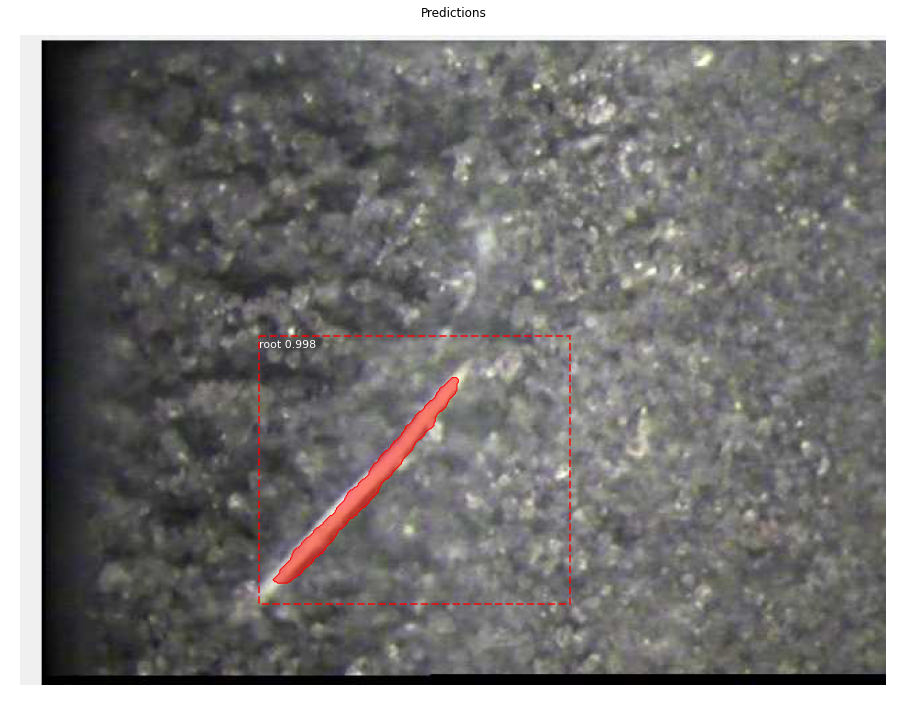

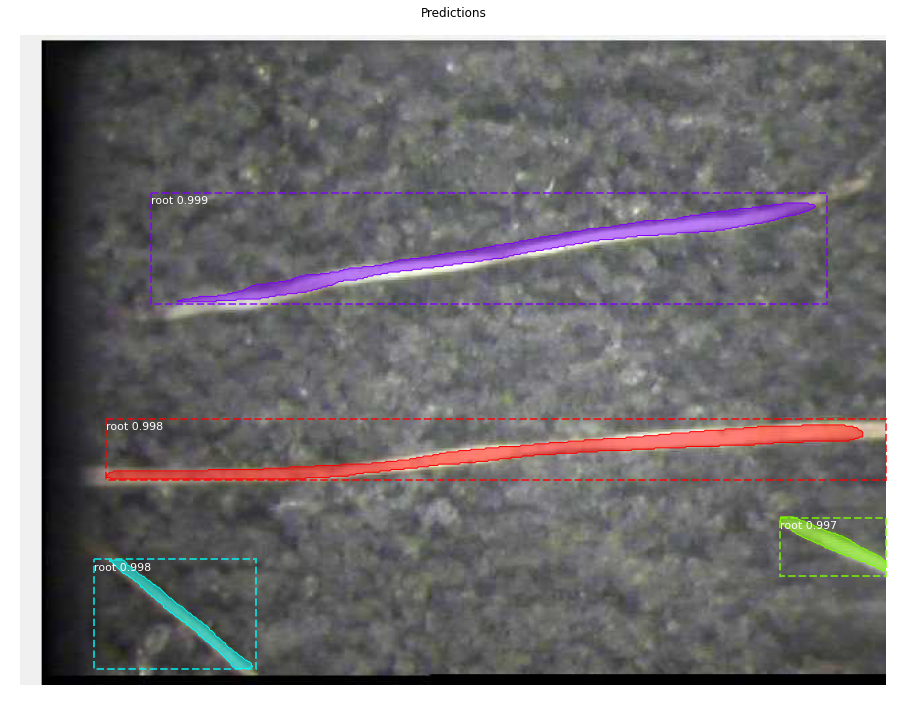

...

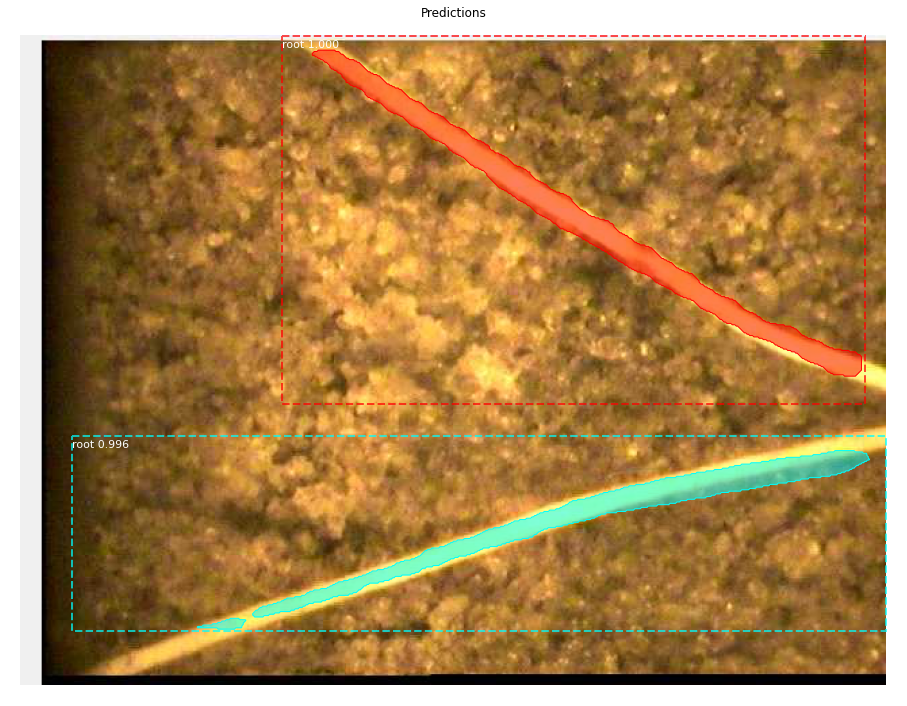

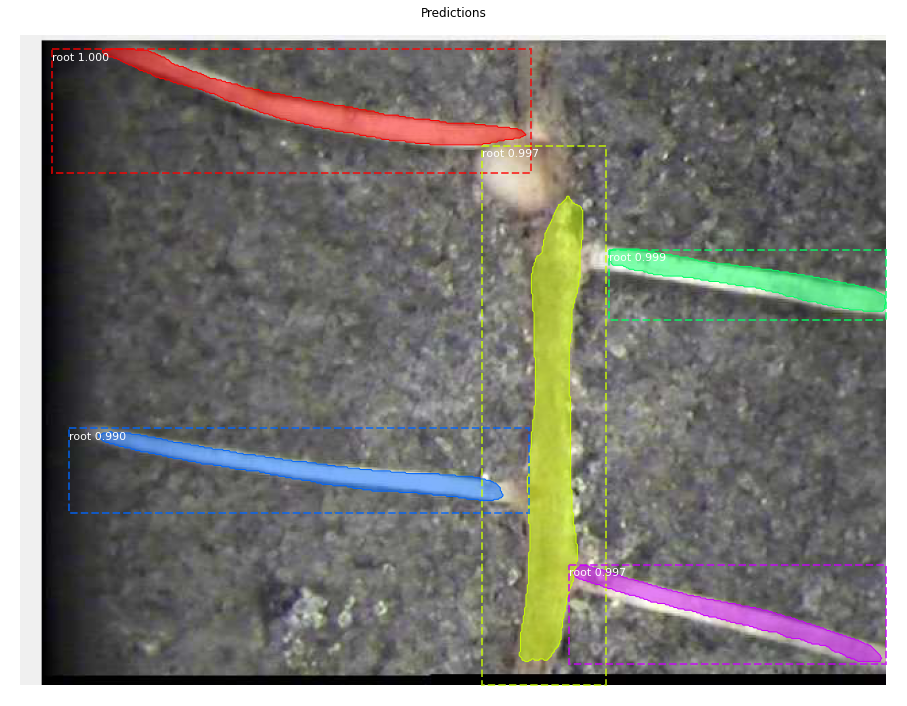

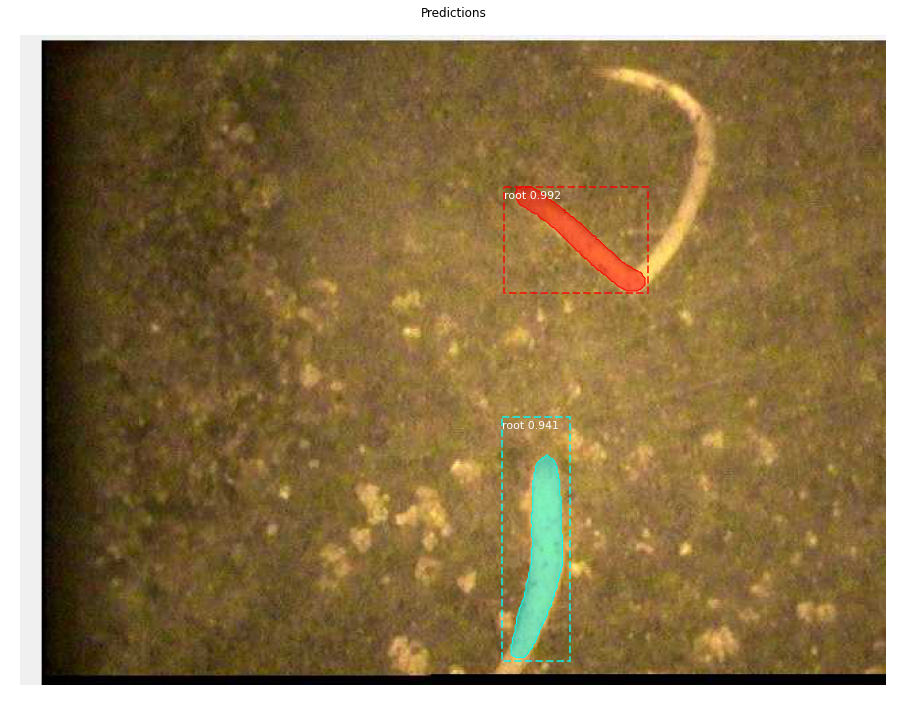

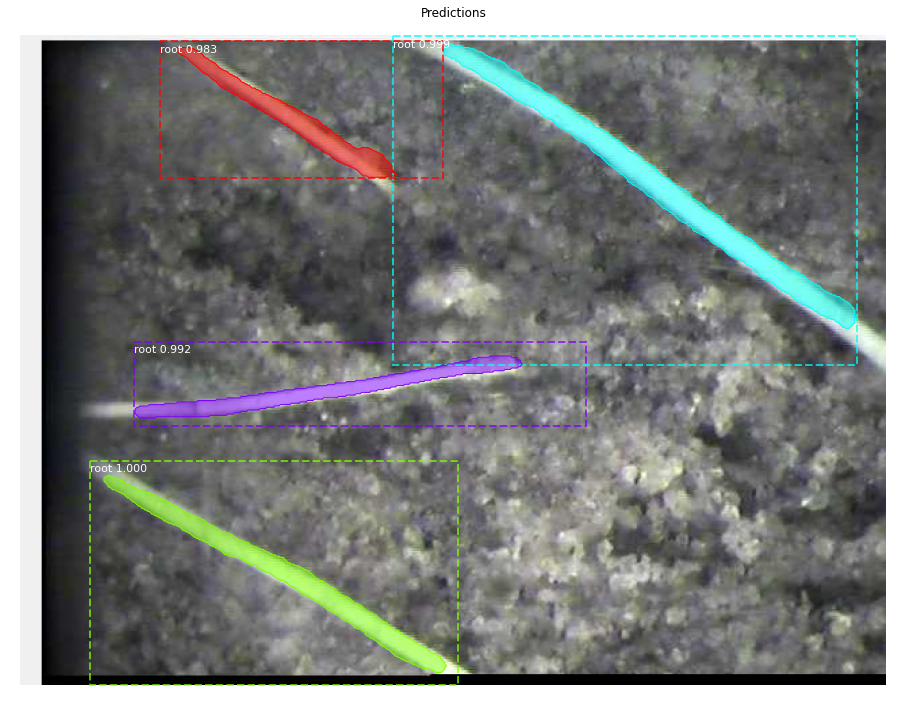

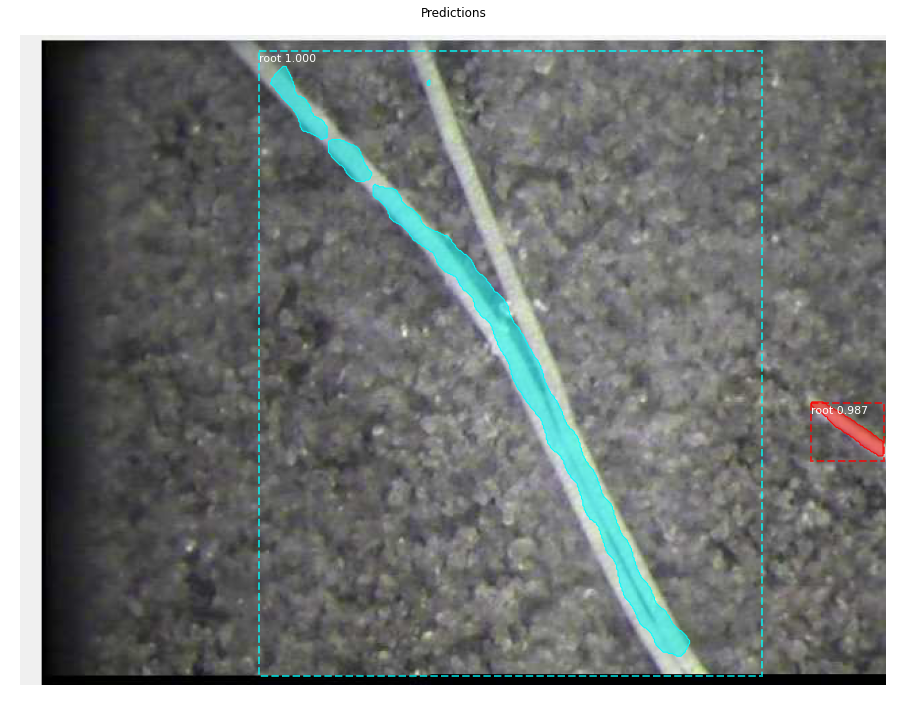

In [14]:
inf_dataset = InferenceDataset('../dataset/val')
for image_id in inf_dataset.image_ids:
    # print(len(dataset.image_ids))
    image = inf_dataset.load_image(image_id)

    # Run object detection
    results = model.detect([image], verbose=1)

    # Display results
    ax = get_ax(1)
    r = results[0]
    print(r)
    
    with open(f'../masks/{image_id}.json', 'w') as f:
        json.dump(r['masks'].tolist(), f)
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                                ['BG', 'root'], r['scores'], ax=ax,
                                title="Predictions")


image ID: root.GT_Peanut_T001_L002_2017.06.15_074230_EED_DPI120.png (0) /Users/samiagilani/Desktop/Senior-Project/CIS4914SeniorProject/DynamicMLTechnique/dataset/val/GT_Peanut_T001_L002_2017.06.15_074230_EED_DPI120.png
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
{'rois': array([[ 785,  405,  887,  616],
       [ 555,  413,  902, 1004]], dtype=int32), 'class_ids': array([1, 1], dtype=int32), 'scores': array([0.9999726, 0.9570824], dtype=float32), 'masks': array([[[False, False],
        [False, False],
        [False, False],
        ...,
        [False, False],
        [False, False],
        [False, False]],

       [[False, False],
  

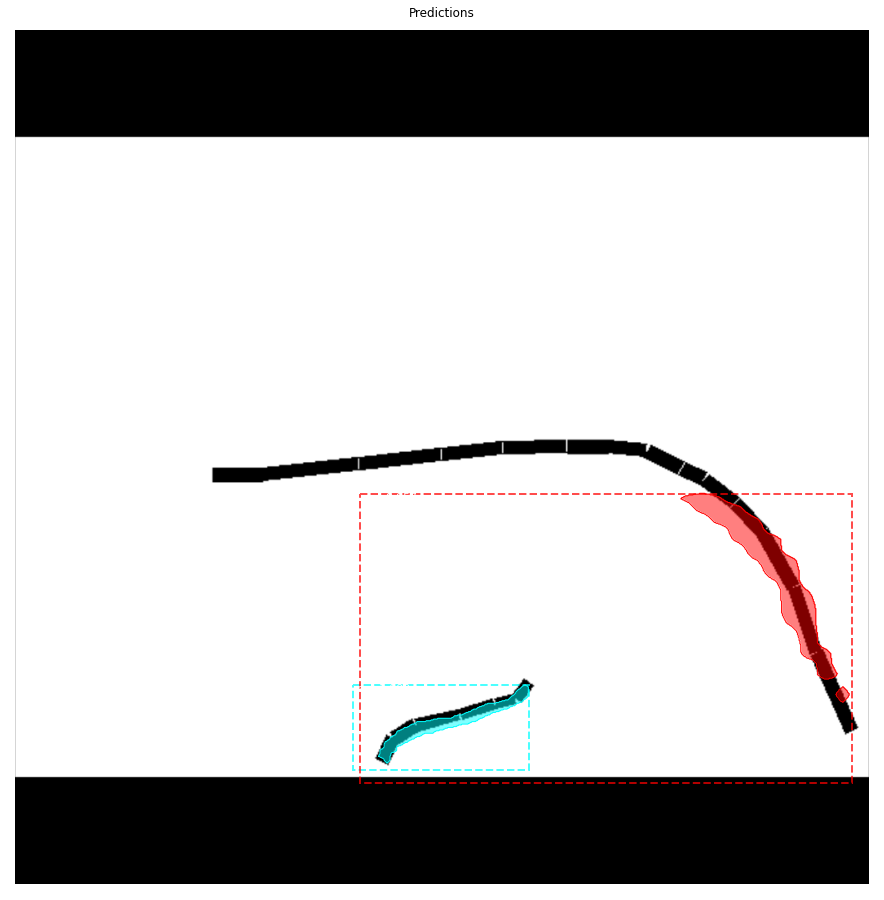

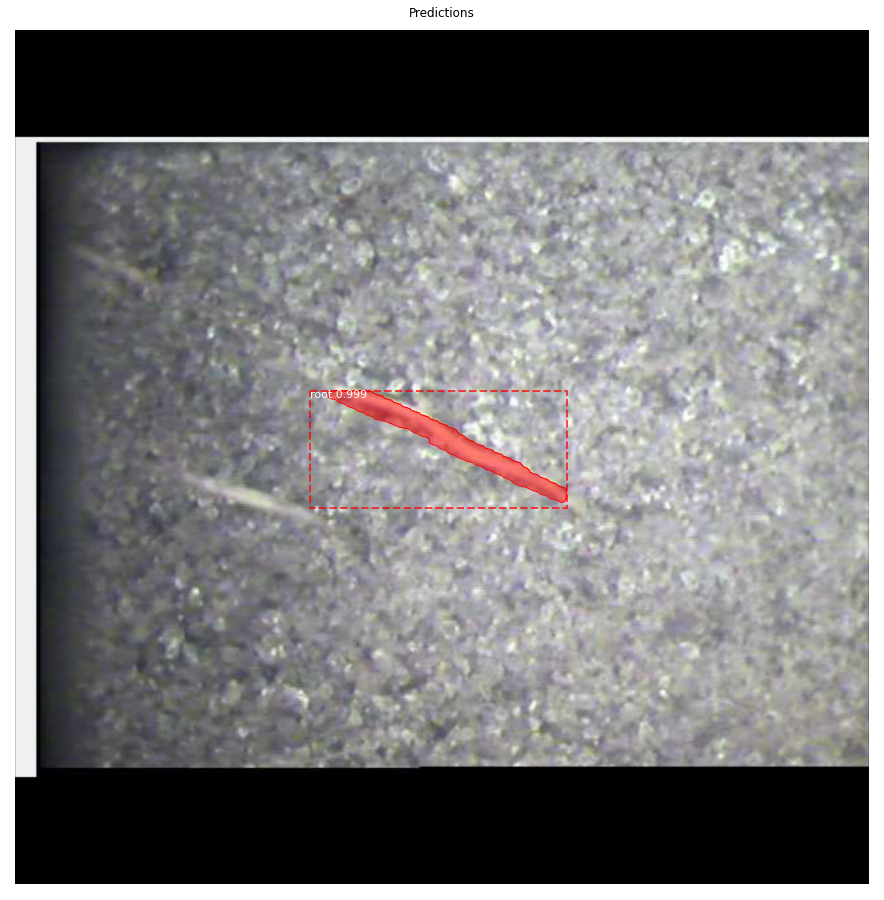

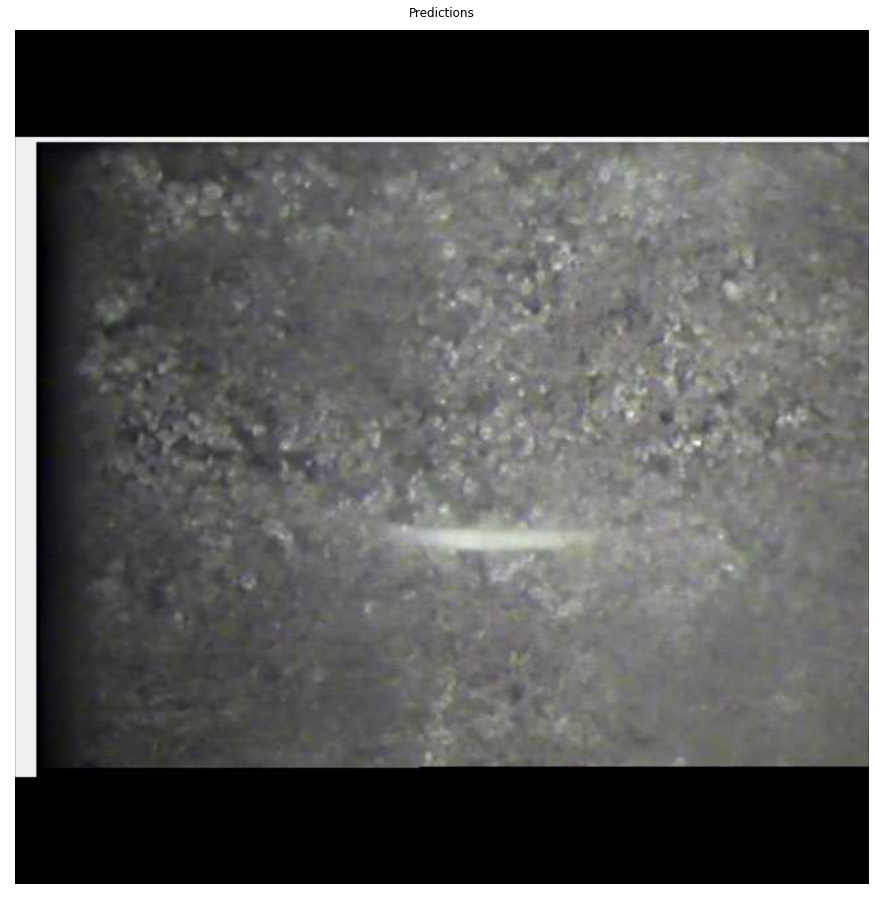

In [60]:
# # image_id = random.choice(dataset.image_ids)
# for image_id in dataset.image_ids:
#     # print(len(dataset.image_ids))
#     image, image_meta, gt_class_id, gt_bbox, gt_mask =\
#         modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
#     info = dataset.image_info[image_id]
#     print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
#                                         dataset.image_reference(image_id)))

#     # Run object detection
#     results = model.detect([image], verbose=1)

#     # Display results
#     ax = get_ax(1)
#     r = results[0]
#     print(r)
#     visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
#                                 dataset.class_names, r['scores'], ax=ax,
#                                 title="Predictions")
#     log("gt_class_id", gt_class_id)
#     log("gt_bbox", gt_bbox)
#     log("gt_mask", gt_mask)
